In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from sklearn import linear_model

In [4]:
housing_price = pd.read_csv("Housing_Price.csv")
housing_price

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500.0
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500.0
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500.0
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000.0
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2914,2915,160,RM,21.0,1936,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2006,WD,Normal,NaN
2915,2916,160,RM,21.0,1894,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,4,2006,WD,Abnorml,NaN
2916,2917,20,RL,160.0,20000,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2006,WD,Abnorml,NaN
2917,2918,85,RL,62.0,10441,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,MnPrv,Shed,700,7,2006,WD,Normal,NaN


Dummify the categorical viriables

In [5]:
housing_price['MSZoning'] = housing_price['MSZoning'].map({'RL':0,'RM':1,'FV':2,'RH':3,'C (all)':4})
housing_price['Street'] = housing_price['Street'].map({'Pave':0,'Grvl':1})
housing_price['Alley'] = housing_price['Alley'].map({'Pave':0,'Grvl':1})
housing_price['LotShape'] = housing_price['LotShape'].map({'Reg':0,'IR1':1,'IR2':2,'IR3':3})
housing_price['LandContour'] = housing_price['LandContour'].map({'Lvl ':0,'HLS':1,'Bnk':2,'Low':3})
housing_price['Utilities'] = housing_price['Utilities'].map({'AllPub':0,'NoSeWa':1})
housing_price['LotConfig'] = housing_price['LotConfig'].map({'Inside':0,'Corner':1,'CulDSac':2,'FR2':3,'FR3':4})
housing_price['LandSlope'] = housing_price['LandSlope'].map({'Gtl':0,'Mod':1,'Sev':2})
housing_price['Neighborhood'] = housing_price['Neighborhood'].map({'NAmes':0,'CollgCr':1,'OldTown':2,'Edwards':3,'Somerst':4,'NridgHt':5,'Gilbert':6,'Sawyer':7,'NWAmes':8,'SawyerW':9,'Mitchel':10,'BrkSide':11,'Crawfor':12,'IDOTRR':13,'Timber':14,'NoRidge':15,'StoneBr':16,'SWISU':17,'ClearCr':18,'MeadowV':19,'BrDale':20,'Blmngtn':21,'Veenker':22,'NPkVill':23,'Blueste':24})
housing_price['Condition1'] = housing_price['Condition1'].map({'Norm':0,'Feedr':1,'Artery':2,'RRAn':3,'PosN':4,'RRAe':5,'PosA':6,'RRNn':7,'RRNe':8})
housing_price['Condition2'] = housing_price['Condition2'].map({'Norm':0,'Feedr':1,'Artery':2,'RRAn':3,'PosN':4,'RRAe':5,'PosA':6,'RRNn':8})
housing_price['BldgType'] = housing_price['BldgType'].map({'1Fam':0,'TwnhsE':1,'Duplex':2,'Twnhs':3,'2fmCon':4})
housing_price['HouseStyle'] = housing_price['HouseStyle'].map({'1Story':0,'2Story':1,'1.5Fin':2,'SLvl':3,'SFoyer':4,'2.5Unf':5,'1.5Unf':6,'2.5Fin':7})
housing_price['RoofStyle'] = housing_price['RoofStyle'].map({'Gable':0,'Hip':1,'Gambrel':2,'Flat':3,'Mansard':4,'Shed':5})
housing_price['RoofMatl'] = housing_price['RoofMatl'].map({'CompShg':0,'Tar&Grv':1,'WdShake':2,'WdShngl':3,'Metal':4,'Membran':5,'Roll':6,'ClyTile':7})
housing_price['Exterior1st'] = housing_price['Exterior1st'].map({'VinylSd':0,'MetalSd':1,'HdBoard':2,'Wd Sdng':3,'Plywood':4,'CemntBd':5,'BrkFace':6,'WdShing':7,'AsbShng':8,'Stucco':9,'BrkComm':10,'AsphShn':11,'Stone':12,'CBlock':13,'ImStucc':14})
housing_price['Exterior2nd'] = housing_price['Exterior2nd'].map({'VinylSd':0,'MetalSd':1,'HdBoard':2,'Wd Sdng':3,'Plywood':4,'CemntBd':5,'BrkFace':6,'Wd Shng':7,'AsbShng':8,'Stucco':9,'Brk Cmn':10,'AsphShn':11,'Stone':12,'CBlock':13,'ImStucc':14,'other':15})
housing_price['MasVnrType'] = housing_price['MasVnrType'].map({'None':0,'BrkFace':1,'Stone':2,'BrkCmn':3})
housing_price['ExterQual'] = housing_price['ExterQual'].map({'Po':0,'Fa':1,'TA':2,'Gd':3,'Ex':4})
housing_price['ExterCond'] = housing_price['ExterCond'].map({'Po':0,'Fa':1,'TA':2,'Gd':3,'Ex':4})
housing_price['Foundation'] = housing_price['Foundation'].map({'PConc':0,'CBlock':1,'BrkTil':2,'Slab':3,'Stone':4,'Wood':5})
housing_price['BsmtQual'] = housing_price['BsmtQual'].map({'Po':0,'Fa':1,'TA':2,'Gd':3,'Ex':4})
housing_price['BsmtCond'] = housing_price['BsmtCond'].map({'Po':0,'Fa':1,'TA':2,'Gd':3,'Ex':4})
housing_price['BsmtExposure'] = housing_price['BsmtExposure'].map({'No':0,'Av':1,'Gd':2,'Mn':3})
housing_price['BsmtFinType1'] = housing_price['BsmtFinType1'].map({'Unf':0,'GLQ':1,'ALQ':2,'Rec':3,'BLQ':4,'LwQ':5})
housing_price['BsmtFinType2'] = housing_price['BsmtFinType2'].map({'Unf':0,'GLQ':1,'ALQ':2,'Rec':3,'BLQ':4,'LwQ':5})
housing_price['Heating'] = housing_price['Heating'].map({'GasA':0,'GasW':1,'Grav':2,'Wall':3,'OthW':4,'Floor':5})
housing_price['HeatingQC'] = housing_price['HeatingQC'].map({'Po':0,'Fa':1,'TA':2,'Gd':3,'Ex':4})
housing_price['CentralAir'] = housing_price['CentralAir'].map({'Y':0,'N':1})
housing_price['Electrical'] = housing_price['Electrical'].map({'SBrkr':0,'FuseA':1,'FuseF':2,'FuseP':3,'Mix':4})
housing_price['KitchenQual'] = housing_price['KitchenQual'].map({'Po':0,'Fa':1,'TA':2,'Gd':3,'Ex':4})
housing_price['Functional'] = housing_price['Functional'].map({'Typ':0,'Min1':1,'Min2':2,'Mod':3,'Maj1':4,'Maj2':5,'Sev':6})
housing_price['FireplaceQu'] = housing_price['FireplaceQu'].map({'Po':0,'Fa':1,'TA':2,'Gd':3,'Ex':4})
housing_price['GarageType'] = housing_price['GarageType'].map({'Attchd':0,'Detchd':1,'BuiltIn':2,'Basment':3,'2Types':4,'CarPort':5})
housing_price['GarageFinish'] = housing_price['GarageFinish'].map({'Unf':0,'RFn':1,'Fin':2})
housing_price['GarageQual'] = housing_price['GarageQual'].map({'Po':0,'Fa':1,'TA':2,'Gd':3,'Ex':4})
housing_price['GarageCond'] = housing_price['GarageCond'].map({'Po':0,'Fa':1,'TA':2,'Gd':3,'Ex':4})
housing_price['PavedDrive'] = housing_price['PavedDrive'].map({'Y':0,'N':1,'P':2})
housing_price['PoolQC'] = housing_price['PoolQC'].map({'Po':0,'Fa':1,'TA':2,'Gd':3,'Ex':4})
housing_price['Fence'] = housing_price['Fence'].map({'MnPrv':0,'MnWw':1,'GdWo':2,'GdPrv':3})
housing_price['MiscFeature'] = housing_price['MiscFeature'].map({'Shed':0,'Gar2':1,'Othr':2,'TenC':3})
housing_price['SaleType'] = housing_price['SaleType'].map({'WD':0,'New':1,'COD':2,'ConLD':3,'CWD':4,'ConLI':5,'ConLw':6,'Oth':7,'Con':8})
housing_price['SaleCondition'] = housing_price['SaleCondition'].map({'Normal':0,'Partial':1,'Abnorml':2,'Family':3,'Alloca':4,'AdjLand':5})
housing_price

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,0.0,65.0,8450,0,NaN,0,NaN,0.0,...,0,NaN,NaN,NaN,0,2,2008,0.0,0,208500.0
1,2,20,0.0,80.0,9600,0,NaN,0,NaN,0.0,...,0,NaN,NaN,NaN,0,5,2007,0.0,0,181500.0
2,3,60,0.0,68.0,11250,0,NaN,1,NaN,0.0,...,0,NaN,NaN,NaN,0,9,2008,0.0,0,223500.0
3,4,70,0.0,60.0,9550,0,NaN,1,NaN,0.0,...,0,NaN,NaN,NaN,0,2,2006,0.0,2,140000.0
4,5,60,0.0,84.0,14260,0,NaN,1,NaN,0.0,...,0,NaN,NaN,NaN,0,12,2008,0.0,0,250000.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2914,2915,160,1.0,21.0,1936,0,NaN,0,NaN,0.0,...,0,NaN,NaN,NaN,0,6,2006,0.0,0,NaN
2915,2916,160,1.0,21.0,1894,0,NaN,0,NaN,0.0,...,0,NaN,NaN,NaN,0,4,2006,0.0,2,NaN
2916,2917,20,0.0,160.0,20000,0,NaN,0,NaN,0.0,...,0,NaN,NaN,NaN,0,9,2006,0.0,2,NaN
2917,2918,85,0.0,62.0,10441,0,NaN,0,NaN,0.0,...,0,NaN,0.0,0.0,700,7,2006,0.0,0,NaN


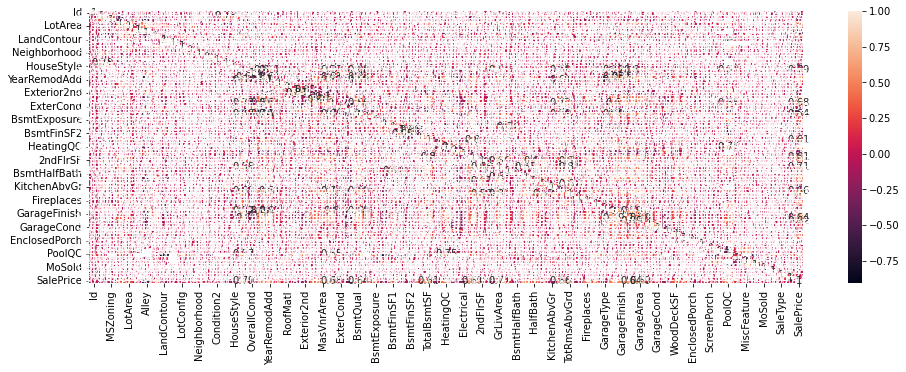

In [6]:
pd.set_option('display.max_columns', None)
plt.figure(figsize = (16,5))
sns.heatmap(housing_price.corr('pearson'), annot=True);

In [7]:
pd.set_option('display.max_rows', None)
hp_corrmat = housing_price.corr('pearson')
hp_corrmat
sorted_mat = hp_corrmat.unstack().sort_values()['SalePrice']
sorted_mat

Alley           -0.534319
Foundation      -0.441842
CentralAir      -0.251328
Electrical      -0.233590
PavedDrive      -0.208954
BsmtFinType1    -0.193381
MSZoning        -0.183642
Exterior2nd     -0.180387
BldgType        -0.173900
LandContour     -0.165295
GarageType      -0.152645
Exterior1st     -0.148133
KitchenAbvGr    -0.135907
EnclosedPorch   -0.128578
Functional      -0.107619
Heating         -0.106673
HouseStyle      -0.091983
MSSubClass      -0.084284
OverallCond     -0.077856
BsmtFinType2    -0.076730
Street          -0.041036
Condition1      -0.029464
YrSold          -0.028923
LowQualFinSF    -0.025606
Id              -0.021917
MiscVal         -0.021190
BsmtHalfBath    -0.016844
Utilities       -0.014314
BsmtFinSF2      -0.011378
Condition2      -0.008329
SaleCondition    0.004591
ExterCond        0.018899
3SsnPorch        0.044584
MoSold           0.046432
LandSlope        0.051152
MiscFeature      0.063745
SaleType         0.076778
LotConfig        0.092316
PoolArea    

At the beginning, we decided to start with one variable with high absolute value of coefficient among all attributes. GrLivArea 0.708624

In [42]:
houseprice2=housing_price[['GrLivArea','SalePrice']]
houseprice2=houseprice2.dropna()
houseprice2

,GrLivArea,SalePrice
0,1710,208500.0
1,1262,181500.0
2,1786,223500.0
3,1717,140000.0
4,2198,250000.0
5,1362,143000.0
6,1694,307000.0
7,2090,200000.0
8,1774,129900.0
9,1077,118000.0


In [43]:
from sklearn.model_selection import train_test_split
X = houseprice2[['GrLivArea']] 
y = houseprice2['SalePrice']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.8, random_state=1234)

In [45]:
lrmodel2 = linear_model.LinearRegression()

In [46]:
lrmodel2.fit(X_train,y_train)

LinearRegression()

In [39]:
lrmodel2.predict(X_test)

array([161036.83072226, 173376.32381519, 185860.98741509, 340467.57734407,
       241316.12107976, 179473.48510816, 198200.48050801, 193555.02428479,
       185860.98741509, 421908.23175737, 321740.58194422, 158714.10261065,
       140277.44822476, 219250.20401947, 152181.42979675, 140567.78923871,
       234638.27775888, 214169.23627532, 196603.60493128, 230863.84457752,
       191377.46668016, 273543.97362833, 232751.0611682 , 133018.92287598,
       180489.67865699, 123728.01042954, 231009.01508449, 276447.38376785,
       192829.17174991, 194861.55884757, 253074.93214478, 223605.31922874,
       235073.78927981, 185860.98741509, 218379.18097762, 498267.91842652,
       140712.95974568, 232170.3791403 , 164085.41136875, 385034.92298557,
       793544.72961484, 256704.19481917, 140567.78923871, 182231.7247407 ,
       187022.35147089, 159004.44362461, 296335.7432235 , 160165.80768041,
       210975.48512186, 166117.79846641, 239864.41601   , 226218.3883543 ,
       193845.36529874, 1

In [47]:
X_test = houseprice2['GrLivArea'].to_numpy().reshape(-1,1)
y_test = houseprice2['SalePrice'].to_numpy().reshape(-1,1)

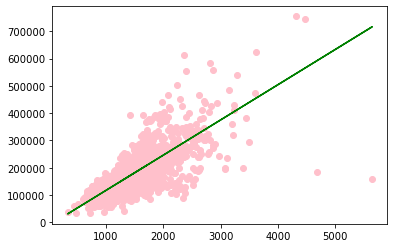

In [49]:
plt.scatter(X['GrLivArea'],y, color='pink')
plt.plot(X_test, lrmodel2.predict(X_test), color='green')

In [48]:
lrmodel2.score(X,y)

0.4801049655553832

We can see that R square score is too low. Maybe it's because there are too few varibales. 

The correlation coefficiency of the variables we think could be correlated to "SalePrice" should be either more than 0.3 or less than -0.3.And we assume the correlation coefficiency more than 0.7 or less than -0.7 shows the two variables highly correlated Based on the assumption above. We decide to choose the variables that meet the above conditions, drop the others and build a new dataframe。 LotFrontage：0.351799 Alley -0.534319 OverallQual 0.790982 YearBuilt 0.522897 YearRemodAdd 0.507101 MasVnrType 0.384602 MasVnrArea 0.477493 ExterQual 0.567079 Foundation -0.441842 BsmtQual 0.484765 BsmtFinSF1 0.386420 TotalBsmtSF 0.613581 HeatingQC 0.333038 1stFlrSF：0.605852 2ndFlrSF：0.319334 GrLivArea：0.708624 KitchenQual 0.460517 TotRmsAbvGrd 0.533723 Fireplaces 0.466929 OpenPorchSF 0.315856 PoolQC 0.543811 WoodDeckSF 0.324413 GarageFinish 0.513105 GarageCars 0.640409 GarageArea 0.623431 GarageYrBlt 0.486362 FullBath 0.560664

In [9]:
new_houseprice1 = housing_price[['LotFrontage', 'Alley', 'OverallQual','YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'ExterQual', 'Foundation','BsmtQual', 'BsmtFinSF1', 'TotalBsmtSF','HeatingQC', '1stFlrSF', '2ndFlrSF','GrLivArea', 'KitchenQual', 'TotRmsAbvGrd','Fireplaces','FireplaceQu', 'GarageQual','OpenPorchSF','PoolQC','WoodDeckSF','GarageFinish', 'GarageCars','GarageArea','GarageYrBlt','FullBath','SalePrice']]
new_houseprice1

,LotFrontage,Alley,OverallQual,YearBuilt,YearRemodAdd,MasVnrArea,ExterQual,Foundation,BsmtQual,BsmtFinSF1,TotalBsmtSF,HeatingQC,1stFlrSF,2ndFlrSF,GrLivArea,KitchenQual,TotRmsAbvGrd,Fireplaces,FireplaceQu,GarageQual,OpenPorchSF,PoolQC,WoodDeckSF,GarageFinish,GarageCars,GarageArea,GarageYrBlt,FullBath,SalePrice
0,65.0,NaN,7,2003,2003,196.0,3,0,3.0,706.0,856.0,4,856,854,1710,3.0,8,0,NaN,2.0,61,NaN,0,1.0,2.0,548.0,2003.0,2,208500.0
1,80.0,NaN,6,1976,1976,0.0,2,1,3.0,978.0,1262.0,4,1262,0,1262,2.0,6,1,2.0,2.0,0,NaN,298,1.0,2.0,460.0,1976.0,2,181500.0
2,68.0,NaN,7,2001,2002,162.0,3,0,3.0,486.0,920.0,4,920,866,1786,3.0,6,1,2.0,2.0,42,NaN,0,1.0,2.0,608.0,2001.0,2,223500.0
3,60.0,NaN,7,1915,1970,0.0,2,2,2.0,216.0,756.0,3,961,756,1717,3.0,7,1,3.0,2.0,35,NaN,0,0.0,3.0,642.0,1998.0,1,140000.0
4,84.0,NaN,8,2000,2000,350.0,3,0,3.0,655.0,1145.0,4,1145,1053,2198,3.0,9,1,2.0,2.0,84,NaN,192,1.0,3.0,836.0,2000.0,2,250000.0
5,85.0,NaN,5,1993,1995,0.0,2,5,3.0,732.0,796.0,4,796,566,1362,2.0,5,0,NaN,2.0,30,NaN,40,0.0,2.0,480.0,1993.0,1,143000.0
6,75.0,NaN,8,2004,2005,186.0,3,0,4.0,1369.0,1686.0,4,1694,0,1694,3.0,7,1,3.0,2.0,57,NaN,255,1.0,2.0,636.0,2004.0,2,307000.0
7,NaN,NaN,7,1973,1973,240.0,2,1,3.0,859.0,1107.0,4,1107,983,2090,2.0,7,2,2.0,2.0,204,NaN,235,1.0,2.0,484.0,1973.0,2,200000.0
8,51.0,NaN,7,1931,1950,0.0,2,2,2.0,0.0,952.0,3,1022,752,1774,2.0,8,2,2.0,1.0,0,NaN,90,0.0,2.0,468.0,1931.0,2,129900.0
9,50.0,NaN,5,1939,1950,0.0,2,2,2.0,851.0,991.0,4,1077,0,1077,2.0,5,2,2.0,3.0,4,NaN,0,1.0,1.0,205.0,1939.0,1,118000.0


In [7]:
new_houseprice1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2919 entries, 0 to 2918
Data columns (total 29 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   LotFrontage   2433 non-null   float64
 1   Alley         198 non-null    float64
 2   OverallQual   2919 non-null   int64  
 3   YearBuilt     2919 non-null   int64  
 4   YearRemodAdd  2919 non-null   int64  
 5   MasVnrArea    2896 non-null   float64
 6   ExterQual     2919 non-null   int64  
 7   Foundation    2919 non-null   int64  
 8   BsmtQual      2838 non-null   float64
 9   BsmtFinSF1    2918 non-null   float64
 10  TotalBsmtSF   2918 non-null   float64
 11  HeatingQC     2919 non-null   int64  
 12  1stFlrSF      2919 non-null   int64  
 13  2ndFlrSF      2919 non-null   int64  
 14  GrLivArea     2919 non-null   int64  
 15  KitchenQual   2918 non-null   float64
 16  TotRmsAbvGrd  2919 non-null   int64  
 17  Fireplaces    2919 non-null   int64  
 18  FireplaceQu   1499 non-null 

Drop the variable that has too many null value.

In [10]:
new_houseprice=new_houseprice1.drop(['PoolQC','Alley'],axis=1)
new_houseprice

,LotFrontage,OverallQual,YearBuilt,YearRemodAdd,MasVnrArea,ExterQual,Foundation,BsmtQual,BsmtFinSF1,TotalBsmtSF,HeatingQC,1stFlrSF,2ndFlrSF,GrLivArea,KitchenQual,TotRmsAbvGrd,Fireplaces,FireplaceQu,GarageQual,OpenPorchSF,WoodDeckSF,GarageFinish,GarageCars,GarageArea,GarageYrBlt,FullBath,SalePrice
0,65.0,7,2003,2003,196.0,3,0,3.0,706.0,856.0,4,856,854,1710,3.0,8,0,NaN,2.0,61,0,1.0,2.0,548.0,2003.0,2,208500.0
1,80.0,6,1976,1976,0.0,2,1,3.0,978.0,1262.0,4,1262,0,1262,2.0,6,1,2.0,2.0,0,298,1.0,2.0,460.0,1976.0,2,181500.0
2,68.0,7,2001,2002,162.0,3,0,3.0,486.0,920.0,4,920,866,1786,3.0,6,1,2.0,2.0,42,0,1.0,2.0,608.0,2001.0,2,223500.0
3,60.0,7,1915,1970,0.0,2,2,2.0,216.0,756.0,3,961,756,1717,3.0,7,1,3.0,2.0,35,0,0.0,3.0,642.0,1998.0,1,140000.0
4,84.0,8,2000,2000,350.0,3,0,3.0,655.0,1145.0,4,1145,1053,2198,3.0,9,1,2.0,2.0,84,192,1.0,3.0,836.0,2000.0,2,250000.0
5,85.0,5,1993,1995,0.0,2,5,3.0,732.0,796.0,4,796,566,1362,2.0,5,0,NaN,2.0,30,40,0.0,2.0,480.0,1993.0,1,143000.0
6,75.0,8,2004,2005,186.0,3,0,4.0,1369.0,1686.0,4,1694,0,1694,3.0,7,1,3.0,2.0,57,255,1.0,2.0,636.0,2004.0,2,307000.0
7,NaN,7,1973,1973,240.0,2,1,3.0,859.0,1107.0,4,1107,983,2090,2.0,7,2,2.0,2.0,204,235,1.0,2.0,484.0,1973.0,2,200000.0
8,51.0,7,1931,1950,0.0,2,2,2.0,0.0,952.0,3,1022,752,1774,2.0,8,2,2.0,1.0,0,90,0.0,2.0,468.0,1931.0,2,129900.0
9,50.0,5,1939,1950,0.0,2,2,2.0,851.0,991.0,4,1077,0,1077,2.0,5,2,2.0,3.0,4,0,1.0,1.0,205.0,1939.0,1,118000.0


In [12]:
houseprice=new_houseprice.dropna()
houseprice

,LotFrontage,OverallQual,YearBuilt,YearRemodAdd,MasVnrArea,ExterQual,Foundation,BsmtQual,BsmtFinSF1,TotalBsmtSF,HeatingQC,1stFlrSF,2ndFlrSF,GrLivArea,KitchenQual,TotRmsAbvGrd,Fireplaces,FireplaceQu,GarageQual,OpenPorchSF,WoodDeckSF,GarageFinish,GarageCars,GarageArea,GarageYrBlt,FullBath,SalePrice
1,80.0,6,1976,1976,0.0,2,1,3.0,978.0,1262.0,4,1262,0,1262,2.0,6,1,2.0,2.0,0,298,1.0,2.0,460.0,1976.0,2,181500.0
2,68.0,7,2001,2002,162.0,3,0,3.0,486.0,920.0,4,920,866,1786,3.0,6,1,2.0,2.0,42,0,1.0,2.0,608.0,2001.0,2,223500.0
3,60.0,7,1915,1970,0.0,2,2,2.0,216.0,756.0,3,961,756,1717,3.0,7,1,3.0,2.0,35,0,0.0,3.0,642.0,1998.0,1,140000.0
4,84.0,8,2000,2000,350.0,3,0,3.0,655.0,1145.0,4,1145,1053,2198,3.0,9,1,2.0,2.0,84,192,1.0,3.0,836.0,2000.0,2,250000.0
6,75.0,8,2004,2005,186.0,3,0,4.0,1369.0,1686.0,4,1694,0,1694,3.0,7,1,3.0,2.0,57,255,1.0,2.0,636.0,2004.0,2,307000.0
8,51.0,7,1931,1950,0.0,2,2,2.0,0.0,952.0,3,1022,752,1774,2.0,8,2,2.0,1.0,0,90,0.0,2.0,468.0,1931.0,2,129900.0
9,50.0,5,1939,1950,0.0,2,2,2.0,851.0,991.0,4,1077,0,1077,2.0,5,2,2.0,3.0,4,0,1.0,1.0,205.0,1939.0,1,118000.0
11,85.0,9,2005,2006,286.0,4,0,4.0,998.0,1175.0,4,1182,1142,2324,4.0,11,2,3.0,2.0,21,147,2.0,3.0,736.0,2005.0,3,345000.0
13,91.0,7,2006,2007,306.0,3,0,3.0,0.0,1494.0,4,1494,0,1494,3.0,7,1,3.0,2.0,33,160,1.0,3.0,840.0,2006.0,2,279500.0
20,101.0,8,2005,2006,380.0,3,0,4.0,0.0,1158.0,4,1158,1218,2376,3.0,9,1,3.0,2.0,154,240,1.0,3.0,853.0,2005.0,3,325300.0


In [10]:
houseprice.columns

Index(['LotFrontage', 'OverallQual', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea',
       'ExterQual', 'Foundation', 'BsmtQual', 'BsmtFinSF1', 'TotalBsmtSF',
       'HeatingQC', '1stFlrSF', '2ndFlrSF', 'GrLivArea', 'KitchenQual',
       'TotRmsAbvGrd', 'Fireplaces', 'FireplaceQu', 'GarageQual',
       'OpenPorchSF', 'WoodDeckSF', 'GarageFinish', 'GarageCars', 'GarageArea',
       'GarageYrBlt', 'FullBath', 'SalePrice'],
      dtype='object')

In [93]:
from sklearn.model_selection import train_test_split
X = houseprice[['LotFrontage', 'OverallQual', 'YearBuilt', 'YearRemodAdd',
       'MasVnrArea', 'ExterQual', 'Foundation', 'BsmtQual', 'BsmtFinSF1',
       'TotalBsmtSF', 'HeatingQC', '1stFlrSF', '2ndFlrSF', 'GrLivArea',
       'KitchenQual', 'TotRmsAbvGrd', 'Fireplaces', 'FireplaceQu',
       'GarageQual', 'OpenPorchSF', 'WoodDeckSF', 'GarageFinish', 'GarageCars',
       'GarageArea', 'GarageYrBlt', 'FullBath']] 
y = houseprice['SalePrice']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1234)

build the multiple linear regression model

In [94]:
from sklearn.linear_model import LinearRegression
lrModel = LinearRegression()

In [95]:
lrModel.fit(X_train,y_train)

LinearRegression()

In [98]:
X_train=X_train.values.reshape(-1,1)
X_test=X_test.values.reshape(-1,1)

In [96]:
y_pred = lrModel.predict(X_test)
y_pred

array([125793.14778928, 212039.73762487,  90444.72015278, 246371.68924464,
       167044.03775119, 124135.14116029, 251237.74079343, 190775.04144571,
       159804.55213969, 236808.82421962, 316571.48036042, 200072.70272051,
       154562.89356269, 207740.05383517, 182538.17651919, 140639.24764642,
       223943.61949358, 220103.13708041, 270883.85489694, 334472.95724723,
       234749.50637735, 233709.12581832, 155112.08299736, 125844.77072734,
       246086.57533173, 102848.06158707, 223466.26155294, 264255.13000373,
       227999.25561978, 306410.63905336, 253869.6937237 , 201090.91429174,
       250451.51267679, 202596.80368919, 245551.30694621, 322455.57937624,
       171494.01851866, 218746.14321533, 198314.99601959, 374008.46235262,
       885941.14094461, 370762.71874943, 116850.58531312, 161267.80412139,
       132794.76227553, 109436.88271086, 275027.33841247, 159555.56591108,
       286049.98693305, 150650.01542204, 327975.76023115, 319952.14420152,
       174173.89723232, 1

In [20]:
lrModel.coef_

array([ 1.43726631e+02,  1.43485993e+04, -6.79982097e+01,  2.26065611e+02,
        2.45436291e+01,  1.63632368e+04, -3.98102571e+03,  1.72247246e+04,
        2.52525091e+01,  3.54755066e+01,  6.33515318e+02,  9.03851912e+01,
        1.01529614e+02, -5.39737329e+01,  7.23231325e+03,  4.43944695e+03,
        1.50811470e+04,  6.24767460e+02,  4.13805649e+03, -4.56205623e+01,
        1.63731787e+01, -9.17466212e+01,  4.18961319e+03,  2.93174007e+01,
       -2.57774326e+02, -2.46997220e+03])

In [18]:
lrModel.intercept_

-6650.566574635683

In [101]:
lrModel.score(X,y)

0.7132248483755176

We found a house in Iowa on sale with the feather as below. 
Address: 2632 Pinto Ln, Iowa City, IA 52240
(Our data is from Iowan real-estate market)

6 rooms above ground(3 bedrooms 3 bathrooms)
Built in 2012
Total number of fireplaces: 1
2 Attached garage spaces
Total interior livable area: 1,591 sqft
Finished area below ground: 380

The full detail is as below.
https://www.zillow.com/homedetails/2632-Pinto-Ln-Iowa-City-IA-52240/123317216_zpid/?

In [37]:
house2003=pd.DataFrame([{'LotFrontage':150, 
                         'OverallQual':8, 
                         'YearBuilt':2012, 
                         'YearRemodAdd':2012,
                         'MasVnrArea':269, 
                         'ExterQual':3, 
                         'Foundation':2, 
                         'BsmtQual':2, 
                         'BsmtFinSF1':779,
                         'TotalBsmtSF':930, 
                         'HeatingQC':2, 
                         '1stFlrSF':1000, 
                         '2ndFlrSF':394, 
                         'GrLivArea':1591,
                         'KitchenQual':2, 
                         'TotRmsAbvGrd':6, 
                         'Fireplaces':1,
                         'FireplaceQu':2,
                         'GarageQual':2, 
                         'OpenPorchSF':58,
                         'WoodDeckSF':48, 
                         'GarageFinish':1, 
                         'GarageCars':2, 
                         'GarageArea':273, 
                         'GarageYrBlt':2012,
                         'FullBath':3
                    }])
house2003

,LotFrontage,OverallQual,YearBuilt,YearRemodAdd,MasVnrArea,ExterQual,Foundation,BsmtQual,BsmtFinSF1,TotalBsmtSF,HeatingQC,1stFlrSF,2ndFlrSF,GrLivArea,KitchenQual,TotRmsAbvGrd,Fireplaces,FireplaceQu,GarageQual,OpenPorchSF,WoodDeckSF,GarageFinish,GarageCars,GarageArea,GarageYrBlt,FullBath
0,150,8,2012,2012,269,3,2,2,779,930,2,1000,394,1591,2,6,1,2,2,58,48,1,2,273,2012,3


In [38]:
lrModel.predict(house2012)

array([182442.07768641])

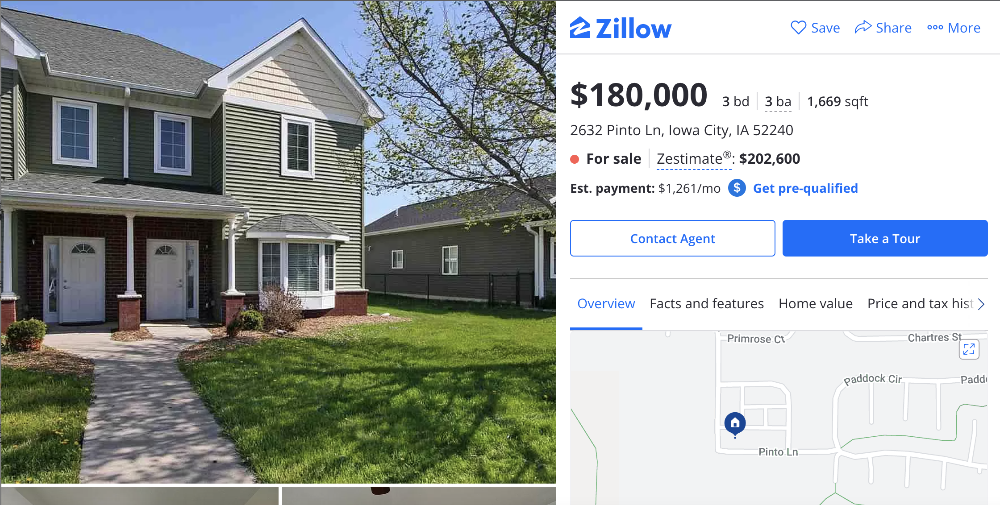

Rebuid and improve the model with couple of related variables, Use Osl
See how quality impact the sales price

In [50]:
houseprice3=houseprice[['ExterQual','BsmtQual','HeatingQC','KitchenQual','FireplaceQu','GarageQual','SalePrice']]
houseprice3

,ExterQual,BsmtQual,HeatingQC,KitchenQual,FireplaceQu,GarageQual,SalePrice
1,2,3.0,4,2.0,2.0,2.0,181500.0
2,3,3.0,4,3.0,2.0,2.0,223500.0
3,2,2.0,3,3.0,3.0,2.0,140000.0
4,3,3.0,4,3.0,2.0,2.0,250000.0
6,3,4.0,4,3.0,3.0,2.0,307000.0
8,2,2.0,3,2.0,2.0,1.0,129900.0
9,2,2.0,4,2.0,2.0,3.0,118000.0
11,4,4.0,4,4.0,3.0,2.0,345000.0
13,3,3.0,4,3.0,3.0,2.0,279500.0
20,3,4.0,4,3.0,3.0,2.0,325300.0


In [46]:
houseprice3['Total_quality']=houseprice3['ExterQual']+houseprice3['BsmtQual']+houseprice3['HeatingQC']+houseprice3['KitchenQual']+houseprice3['FireplaceQu']+houseprice3['GarageQual']
houseprice3

/var/folders/0n/_bv9g42n3jlgrkg83n8v1c280000gn/T/ipykernel_6632/1961698943.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  houseprice3['Total_quality']=houseprice3['ExterQual']+houseprice3['BsmtQual']+houseprice3['HeatingQC']+houseprice3['KitchenQual']+houseprice3['FireplaceQu']+houseprice3['GarageQual']


,ExterQual,BsmtQual,HeatingQC,KitchenQual,FireplaceQu,GarageQual,SalePrice,Total_quality
1,2,3.0,4,2.0,2.0,2.0,181500.0,15.0
2,3,3.0,4,3.0,2.0,2.0,223500.0,17.0
3,2,2.0,3,3.0,3.0,2.0,140000.0,15.0
4,3,3.0,4,3.0,2.0,2.0,250000.0,17.0
6,3,4.0,4,3.0,3.0,2.0,307000.0,19.0
8,2,2.0,3,2.0,2.0,1.0,129900.0,12.0
9,2,2.0,4,2.0,2.0,3.0,118000.0,15.0
11,4,4.0,4,4.0,3.0,2.0,345000.0,21.0
13,3,3.0,4,3.0,3.0,2.0,279500.0,18.0
20,3,4.0,4,3.0,3.0,2.0,325300.0,19.0


In [47]:
houseprice3['Total_quality'].corr(houseprice3['SalePrice'])

0.7001040190735016

Based on the coefficient matrix above, 0.7 is relatively high, We assume that the quality of External, basement, heating, kitchen, fireplace, garage is correlated with sales price.

In [52]:
from statsmodels.formula.api import ols
lrmodel3=ols(formula='SalePrice~ExterQual+BsmtQual+HeatingQC+KitchenQual+FireplaceQu+GarageQual',data=houseprice3)
lrmodel3.fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.559
Model:                            OLS   Adj. R-squared:                  0.554
Method:                 Least Squares   F-statistic:                     121.9
Date:                Tue, 10 May 2022   Prob (F-statistic):           2.99e-99
Time:                        00:13:41   Log-Likelihood:                -7278.2
No. Observations:                 585   AIC:                         1.457e+04
Df Residuals:                     578   BIC:                         1.460e+04
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
===============================================================================
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept   -1.142e+05   2.53e+04     -4.518      0.000   -1.64e+05   -6.45e+04
ExterQual    3.826e+04   7103.758      5.385      0.000    2.43e+04    5.22e+04
BsmtQual     3.773e+04   4949.137      7.624      0.000     2.8e+04    4.75e+04
HeatingQC    -912.1069   3473.008     -0.263      0.793   -7733.360    5909.147
KitchenQual  3.513e+04   5708.054      6.154      0.000    2.39e+04    4.63e+04
FireplaceQu  5112.7898   3814.774      1.340      0.181   -2379.720    1.26e+04
GarageQual   1.257e+04   1.08e+04      1.161      0.246   -8683.384    3.38e+04
==============================================================================
Omnibus:                      258.133   Durbin-Watson:                   1.982
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             2054.601
Skew:                           1.760   Prob(JB):                         0.00
Kurtosis:                      11.480   Cond. No.                         72.1
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

The p-value of HeatingQC(0.793),FireplaceQu(0.181),GarageQual(0.246) is too high(>0.05). so they should be eliminated. Improve the model

In [71]:
from statsmodels.formula.api import ols
lrmodel3=ols(formula='SalePrice~ExterQual+BsmtQual+KitchenQual',data=houseprice3)
lrmodel3.fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.556
Model:                            OLS   Adj. R-squared:                  0.554
Method:                 Least Squares   F-statistic:                     242.9
Date:                Tue, 10 May 2022   Prob (F-statistic):          4.09e-102
Time:                        07:41:05   Log-Likelihood:                -7279.7
No. Observations:                 585   AIC:                         1.457e+04
Df Residuals:                     581   BIC:                         1.458e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
===============================================================================
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept   -8.377e+04   1.17e+04     -7.189      0.000   -1.07e+05   -6.09e+04
ExterQual    3.914e+04   6818.340      5.740      0.000    2.57e+04    5.25e+04
BsmtQual     3.739e+04   4940.516      7.569      0.000    2.77e+04    4.71e+04
KitchenQual   3.63e+04   5580.762      6.505      0.000    2.53e+04    4.73e+04
==============================================================================
Omnibus:                      257.854   Durbin-Watson:                   1.987
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             2017.170
Skew:                           1.764   Prob(JB):                         0.00
Kurtosis:                      11.385   Cond. No.                         23.0
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

The result is not as good as expected. So we guess that the interaction between variables may impact the goodness of fit. So we decided to try adding interaction effect test (ExterQual:GarageQual and KitchenQual:FireplaceQu). Because we found that the External Quality and Garage Quality is highly correlated. The better the External Quality, the better Garage Quality. So do the correlation between Kitchen Quality and Fireplace Quality. 
After we add these 2 interaction effect. We suprisely found that the R-square improve.The p-value of ExterQual:GarageQual and KitchenQual:FireplaceQu tells us that the interaction effect test are is statistically significant. Consequently, we know that the quality of GarageQual depends on the quality of ExterQual. And the quality of fireplace depends on the quality of Kitchen. That’s the “it depends” nature of an interaction effect. 

In [73]:
lrmodel3=ols(formula='SalePrice~ExterQual+BsmtQual+KitchenQual+ExterQual:GarageQual+KitchenQual:FireplaceQu',data=houseprice3)
lrmodel3.fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.560
Model:                            OLS   Adj. R-squared:                  0.556
Method:                 Least Squares   F-statistic:                     147.2
Date:                Tue, 10 May 2022   Prob (F-statistic):          1.12e-100
Time:                        07:48:09   Log-Likelihood:                -7277.5
No. Observations:                 585   AIC:                         1.457e+04
Df Residuals:                     579   BIC:                         1.459e+04
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
===========================================================================================
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
Intercept               -7.592e+04   1.27e+04     -5.996      0.000   -1.01e+05    -5.1e+04
ExterQual                2.221e+04   1.15e+04      1.935      0.053    -334.098    4.48e+04
BsmtQual                 3.775e+04   4940.494      7.641      0.000     2.8e+04    4.75e+04
KitchenQual              2.964e+04   7189.725      4.122      0.000    1.55e+04    4.38e+04
ExterQual:GarageQual     7597.8231   4405.609      1.725      0.085   -1055.100    1.63e+04
KitchenQual:FireplaceQu  1955.5592   1423.896      1.373      0.170    -841.072    4752.191
==============================================================================
Omnibus:                      258.954   Durbin-Watson:                   1.989
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             2074.813
Skew:                           1.764   Prob(JB):                         0.00
Kurtosis:                      11.525   Cond. No.                         57.5
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

The R square is 0.556, which is even worse. So I decide to build the model with square feet of housing. And see what happened.

In [57]:
houseprice4=houseprice[['MasVnrArea','GrLivArea','TotalBsmtSF','GarageArea','SalePrice']]
houseprice4

,MasVnrArea,GrLivArea,TotalBsmtSF,GarageArea,SalePrice
1,0.0,1262,1262.0,460.0,181500.0
2,162.0,1786,920.0,608.0,223500.0
3,0.0,1717,756.0,642.0,140000.0
4,350.0,2198,1145.0,836.0,250000.0
6,186.0,1694,1686.0,636.0,307000.0
8,0.0,1774,952.0,468.0,129900.0
9,0.0,1077,991.0,205.0,118000.0
11,286.0,2324,1175.0,736.0,345000.0
13,306.0,1494,1494.0,840.0,279500.0
20,380.0,2376,1158.0,853.0,325300.0


In [58]:
houseprice4['TotalSQFT']=houseprice4['MasVnrArea']+houseprice4['GrLivArea']+houseprice4['TotalBsmtSF']+houseprice4['GarageArea']+houseprice4['GrLivArea']
houseprice4

/var/folders/0n/_bv9g42n3jlgrkg83n8v1c280000gn/T/ipykernel_44842/4110534941.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  houseprice4['TotalSQFT']=houseprice4['MasVnrArea']+houseprice4['GrLivArea']+houseprice4['TotalBsmtSF']+houseprice4['GarageArea']+houseprice4['GrLivArea']


,MasVnrArea,GrLivArea,TotalBsmtSF,GarageArea,SalePrice,TotalSQFT
1,0.0,1262,1262.0,460.0,181500.0,4246.0
2,162.0,1786,920.0,608.0,223500.0,5262.0
3,0.0,1717,756.0,642.0,140000.0,4832.0
4,350.0,2198,1145.0,836.0,250000.0,6727.0
6,186.0,1694,1686.0,636.0,307000.0,5896.0
8,0.0,1774,952.0,468.0,129900.0,4968.0
9,0.0,1077,991.0,205.0,118000.0,3350.0
11,286.0,2324,1175.0,736.0,345000.0,6845.0
13,306.0,1494,1494.0,840.0,279500.0,5628.0
20,380.0,2376,1158.0,853.0,325300.0,7143.0


In [52]:
houseprice4['TotalSQFT'].corr(houseprice4['SalePrice'])

0.7612363853910413

The coeffient shows that total square feet highly related to salesprice.

In [53]:
lrmodel4=ols(formula='SalePrice~MasVnrArea+GrLivArea+TotalBsmtSF+GarageArea',data=houseprice4)
lrmodel4.fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.605
Model:                            OLS   Adj. R-squared:                  0.602
Method:                 Least Squares   F-statistic:                     222.3
Date:                Wed, 27 Apr 2022   Prob (F-statistic):          1.58e-115
Time:                        23:14:58   Log-Likelihood:                -7245.6
No. Observations:                 585   AIC:                         1.450e+04
Df Residuals:                     580   BIC:                         1.452e+04
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
===============================================================================
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept   -1.685e+04   9419.963     -1.788      0.074   -3.53e+04    1655.253
MasVnrArea     51.5051     12.201      4.221      0.000      27.541      75.469
GrLivArea      66.0107      5.285     12.489      0.000      55.630      76.392
TotalBsmtSF    37.9567      6.468      5.868      0.000      25.252      50.661
GarageArea    126.4957     15.595      8.112      0.000      95.867     157.124
==============================================================================
Omnibus:                      373.940   Durbin-Watson:                   1.982
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            23616.060
Skew:                          -2.057   Prob(JB):                         0.00
Kurtosis:                      33.853   Cond. No.                     9.02e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 9.02e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

The result is pretty well. We raise the goodness of fit by building several models